<a href="https://colab.research.google.com/github/halaalduh/Diabetes-Prediction-using-Healthcare-Dataset/blob/main/classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [10]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn import tree



In [11]:
df = pd.read_csv("/content/Preprocessed_dataset.csv")
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,Age_Bin,Glucose_Bin
0,0.352941,0.680645,0.526316,0.271845,0.525,0.288945,0.491935,0.483333,1,2.0,2
1,0.058824,0.375806,0.467105,0.213592,0.525,0.201005,0.244624,0.166667,0,1.0,1
2,0.470588,0.590323,0.434211,0.213592,0.525,0.144054,0.532258,0.183333,1,1.0,2
3,0.058824,0.400000,0.394737,0.155340,0.000,0.097990,0.079749,0.000000,0,0.0,1
4,0.000000,0.567742,0.223684,0.271845,1.000,0.236181,1.000000,0.200000,1,1.0,2


**Feature Preparation**

The dataset is divided into input features and the target label. All columns except **Outcome** are assigned to X, while the **Outcome** column is stored in y. This separation prepares the data for the training/testing process and ensures the model knows which column it is trying to predict.




In [12]:
# Separate features and label
X = df.drop(columns=["Outcome"])
y = df["Outcome"]


**Define Splits, Criteria, and Train Models**

the experiment is set up by defining three test sizes **(20%, 25%, 30%)** and two decision tree criteria **(Gini and Entropy)**. For every combination, the dataset is split using stratified sampling to keep class distribution balanced. A decision tree model is then trained, predictions are generated, and all results are stored for later comparison.


In [13]:
splits = [0.20, 0.25, 0.30]
criteria = ["gini", "entropy"]

models = []


for test_size in splits:
    for criterion in criteria:



        # split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=test_size, random_state=42, stratify=y
        )

        # classifier
        model = DecisionTreeClassifier(
            criterion=criterion,
            random_state=42
        )

        # train
        model.fit(X_train, y_train)

        # predict
        y_pred = model.predict(X_test)

        # save
        models.append({
            "model": model,
            "criterion": criterion,
            "test_size": test_size,
            "X_test": X_test,
            "y_test": y_test,
            "y_pred": y_pred
        })


**Comparing performance based on accuracy**


In this experiment, we applied a Decision Tree classifier using three different train–test splits (**80/20, 75/25, 70/30**) and two attribute selection criteria (**Gini** and **Entropy**).

As shown in the table below, the accuracy values are close across all configurations. For each split, we compare the Gini and Entropy results:

* The **highest** accuracy overall is achieved with the **80/20 split (Gini)** = **0.98917**.

* The entropy criterion also performs very well but is slightly lower in the 80/20 split (0.98556).

* As the test size increases, accuracy decreases slightly, this is expected because the model trains on fewer examples.

* Gini performs better at the 80/20 split, while Entropy performs slightly better at the 75/25 and 70/30 splits.

In [14]:
results = []

for item in models:
    acc = accuracy_score(item["y_test"], item["y_pred"])


    split_txt = f"{int((1 - item['test_size']) * 100)}/{int(item['test_size'] * 100)}"

    results.append([
        split_txt,
        item["criterion"],
        acc
    ])

results_df = pd.DataFrame(
    results,
    columns=["Split", "Criterion", "Accuracy"]
)

results_df



,Split,Criterion,Accuracy
0,80/20,gini,0.989170
1,80/20,entropy,0.985560
2,70/30,gini,0.968712
3,70/30,entropy,0.971119
4,60/40,gini,0.950361
5,60/40,entropy,0.953069


**Confusion Matrices**

A confusion matrix is generated for every trained model. Each matrix visualizes how well the model classified the positive and negative cases under each split size and criterion.

**Confusion Matrix Summary**

* **70/30 split:** Gini and Entropy both classify the majority of samples correctly. Entropy performs slightly better because it reduces false negatives from 12 (Gini) to 10, making it more accurate in detecting the positive class.

* **75/25 split:** Both criteria achieve strong results, but Entropy is noticeably better here because it produces zero false negatives, while Gini has 2. This means Entropy detects all positive cases correctly in this split.

* **80/20 split:** This split gives the best performance overall. Gini has the lowest total errors (4 false positives and 2 false negatives), making it the most reliable model. Entropy is also strong but has slightly more misclassifications.

 All models perform very well, but the **80/20** split using **Gini** is the most accurate and consistent across the confusion matrices.

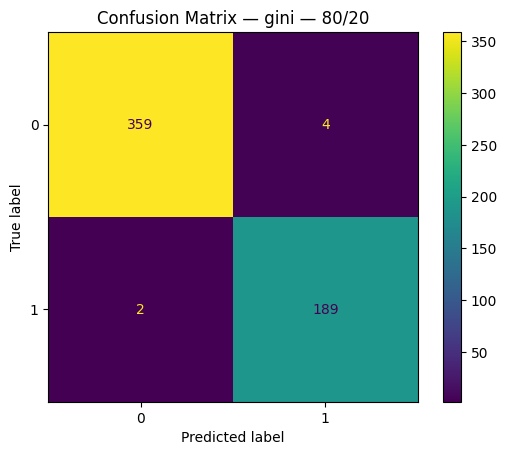

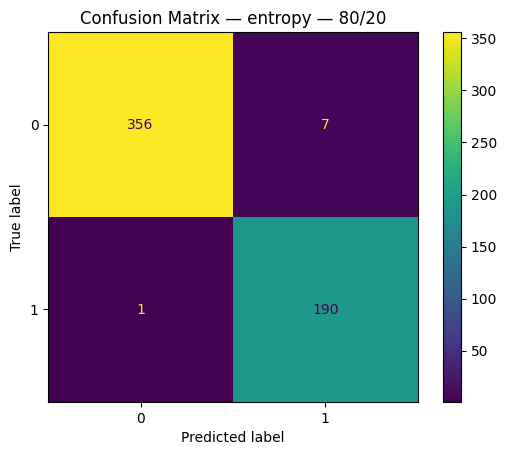

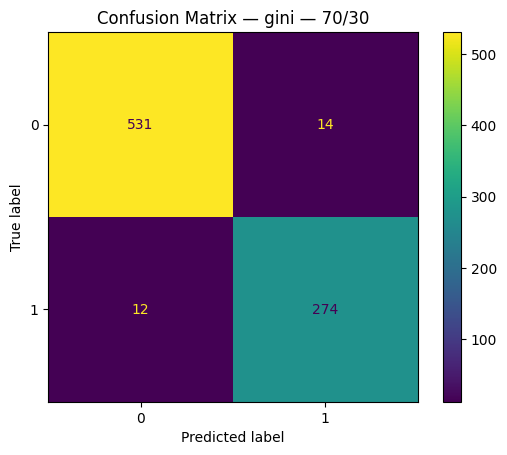

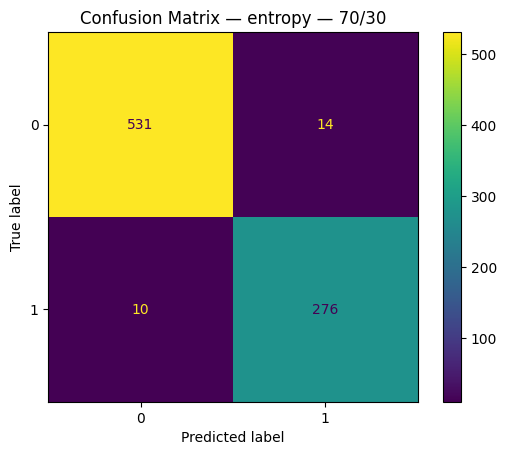

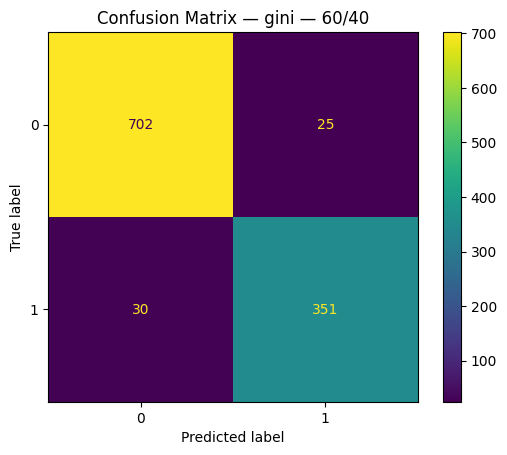

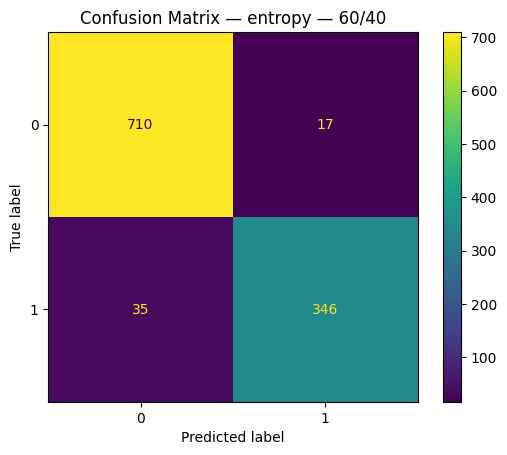

In [15]:
for m in models:
    cm = confusion_matrix(m["y_test"], m["y_pred"])
    split_txt = f"{int((1 - m['test_size'])*100)}/{int(m['test_size']*100)}"
    title = f"Confusion Matrix — {m['criterion']} — {split_txt}"

    ConfusionMatrixDisplay(cm).plot()
    plt.title(title)
    plt.show()


# Plotting the Decision Trees
Each trained decision tree is visualized using Matplotlib. The plotted trees contain colored nodes, making it easier to understand how decisions are made based on the feature values.

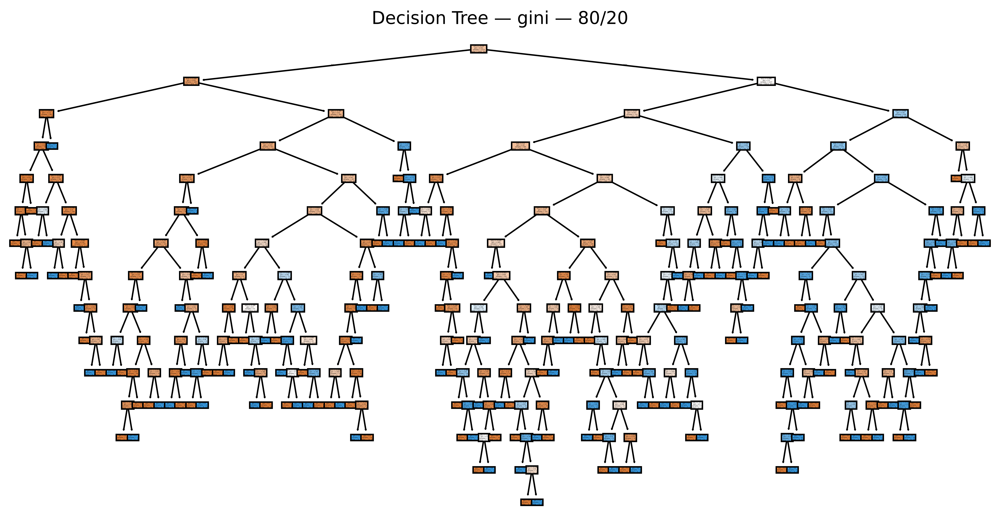

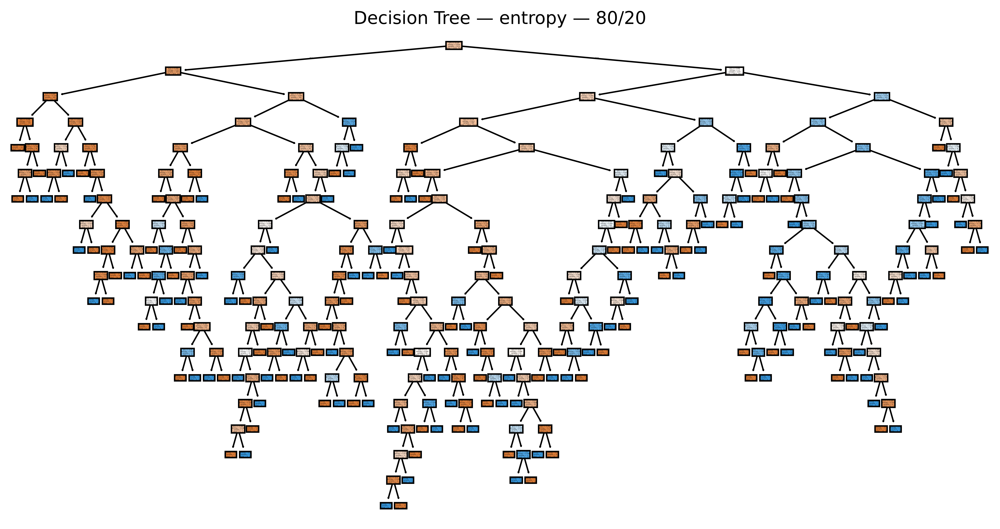

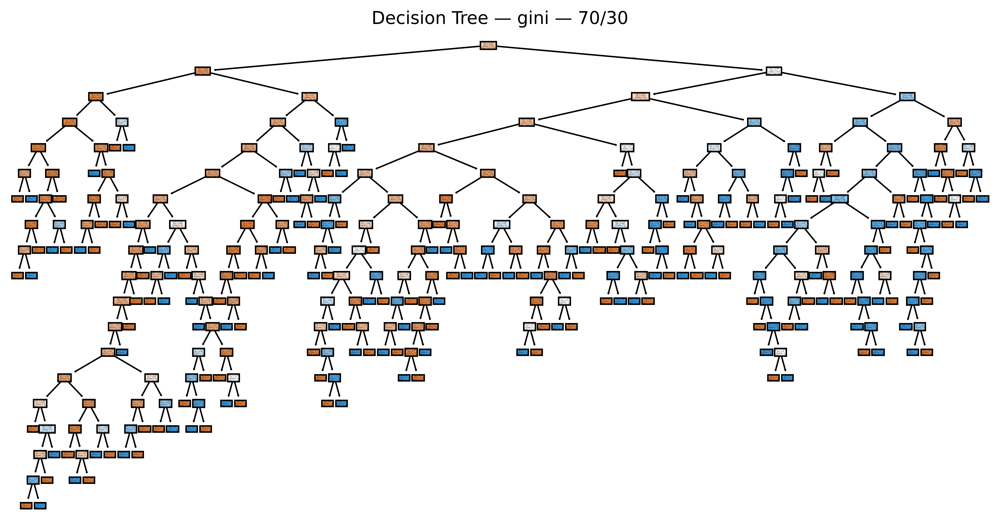

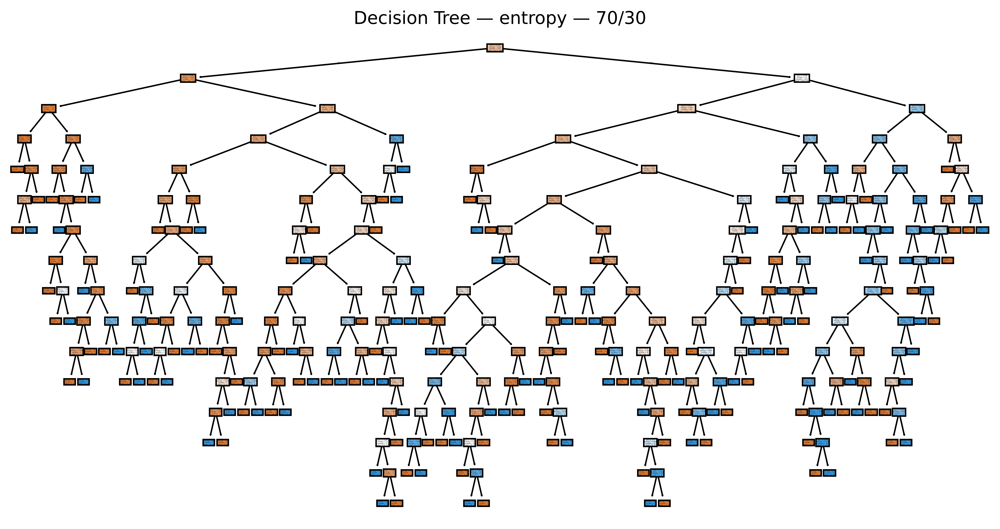

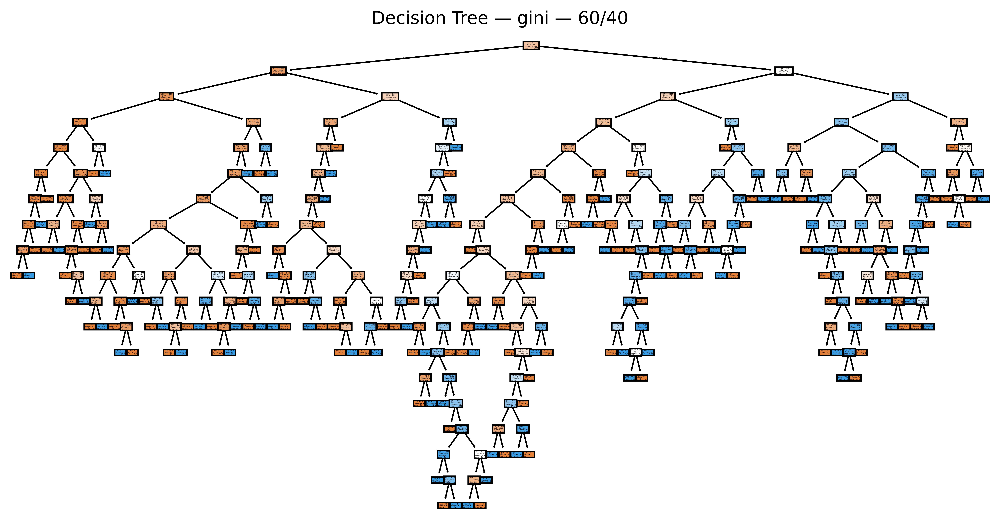

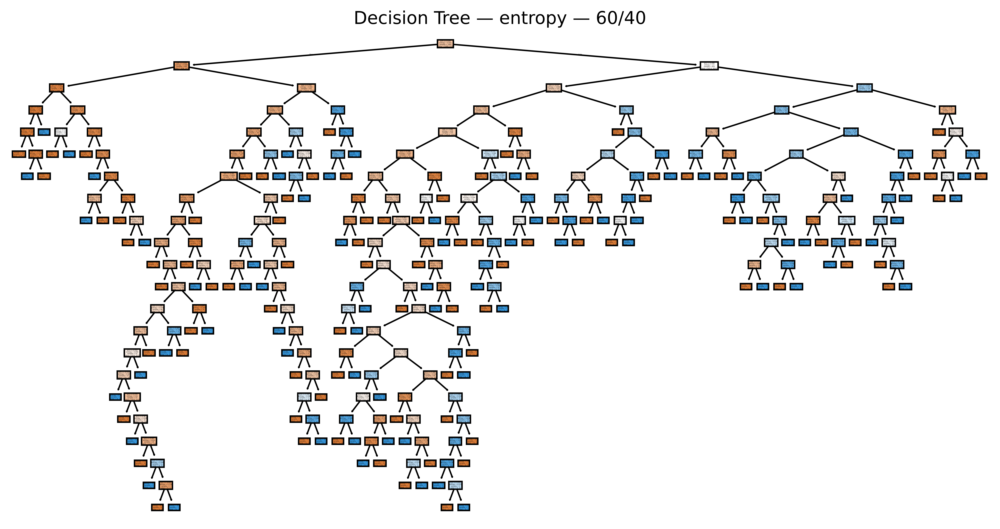

In [16]:
for item in models:
    split_txt = f"{int((1 - item['test_size']) * 100)}/{int(item['test_size'] * 100)}"
    title = f"Decision Tree — {item['criterion']} — {split_txt}"

    plt.figure(figsize=(12, 6),dpi = 1000)
    tree.plot_tree(
        item["model"],   # use the same key name we stored
        filled=True
    )
    plt.title(title)
    plt.show()



###**Best Algorithm for Each Partition**

**80/20** Split :

- Best Criterion: **Gini**

- Accuracy: **0.98917**

**75/25** Split :

- Best Criterion: **Entropy**

- Accuracy: **0.97688**

**70/30** Split :

- Best Criterion: **Entropy**

- Accuracy: **0.97112**

###**Best Algorithm Overall**

The best-performing configuration overall is:

Decision Tree **(Gini)** with **80/20** split — Accuracy = ***0.98917***

This is because:

* It achieved the **highest** accuracy score.

* Its confusion matrix shows the **lowest number of errors**.

* Larger training portion (80%) helped the tree learn the patterns more effectively.

